In [13]:
import mdai
import pydicom as py
from pydicom import dcmread
from pydicom.data import get_testdata_file

# from utilities import (
#     load_mask_instance,
#     get_pixels_hu,
#     load_scan,
#     segment_lung_mask,
#     get_model_memory_usage,
#     batch_generator,
#     grey_to_rgb_3d,
#     resize_3d,
#     normalize_3d,
# )
import glob
import matplotlib.pyplot as plt
import numpy as np

# import copy

import seaborn as sns
import segmentation_models_3D as sm

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import (
    ModelCheckpoint,
    CSVLogger,
    EarlyStopping,
)
import cv2
from patchify import patchify, unpatchify
import tensorflow as tf
import keras
from keras import backend as K
from keras.callbacks import ReduceLROnPlateau

from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split


print(tf.__version__)
print(keras.__version__)

2.8.0
2.8.0


In [2]:
device_name = tf.test.gpu_device_name()
print(device_name)

## Function definitions

In [3]:
def load_mask_instance(row):
    """Load instance masks for the given annotation row. Masks can be different types,
    mask is a binary true/false map of the same size as the image.
    """
    mask = np.zeros((row.height, row.width), dtype=np.uint8)
    annotation_mode = row.annotationMode

    if annotation_mode == "freeform" or annotation_mode == "polygon":
        vertices = np.array(row["data"]["vertices"])
        vertices = vertices.reshape((-1, 2))
        mask_instance = mask[:, :].copy()
        cv2.fillPoly(mask_instance, np.int32([vertices]), (255, 255, 255))
        mask[:, :] = mask_instance
    elif annotation_mode is None:
        print("Not a local instance")
    return mask


def load_scan(paths):
    slices = [py.read_file(path) for path in paths]
    slices.sort(key=lambda x: int(x.InstanceNumber), reverse=True)
    try:
        slice_thickness = np.abs(
            slices[0].ImagePositionPatient[2] - slices[1].ImagePositionPatient[2]
        )
    except:
        slice_thickness = np.abs(slices[0].SliceLocation - slices[1].SliceLocation)
    for s in slices:
        s.SliceThickness = slice_thickness
    return slices


def get_pixels_hu(scans):
    image = np.stack([s.pixel_array for s in scans])
    image = image.astype(np.int16)
    # Set outside-of-scan pixels to 0
    # The intercept is usually -1024, so air is approximately 0
    image[image == -2000] = 0

    # Convert to Hounsfield units (HU)
    intercept = scans[0].RescaleIntercept
    slope = scans[0].RescaleSlope

    if slope != 1:
        image = slope * image.astype(np.float64)
        image = image.astype(np.int16)

    image += np.int16(intercept)

    return np.array(image, dtype=np.int16)


def normalize_data(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))


def normalize_3d(images):
    result = []
    for i in images:
        if i.min() < 0:
            i = (normalize_data(i) * 255).astype(np.uint8)
        result.append(i)
    return np.array(result)

## Load annotations and perform EDA

In [4]:
json_file = "./data/manifest-1608266677008/MIDRC-RICORD-1a_annotations_labelgroup_all_2020-Dec-8.json/MIDRC-RICORD-1a_annotations_labelgroup_all_2020-Dec-8.json"
results = mdai.common_utils.json_to_dataframe(json_file)
annots_df = results["annotations"]
annots_df.height = annots_df.height.astype("Int64")
annots_df.width = annots_df.width.astype("Int64")
annots_df.annotationNumber = annots_df.annotationNumber.astype("Int64")

In [5]:
annots_df.head()

,id,parentId,isImported,createdAt,createdById,updatedAt,updatedById,labelId,annotationNumber,height,...,labelGroupName,annotationMode,color,description,labelName,radlexTagIdsLabel,scope,parentLabelId,datasetId,number
0,A_bG1ryk,None,False,2020-07-10T20:13:56.883Z,U_2vzj7v,2020-07-10T20:14:02.176Z,U_2vzj7v,L_neeyDn,7,512,...,Purple Group 1,freeform,#e65100,,Infectious opacity,[],INSTANCE,None,D_q24k8z,94
1,A_qmVy5W,None,False,2020-07-10T20:16:32.402Z,U_2vzj7v,2020-07-10T20:16:35.274Z,U_2vzj7v,L_neeyDn,7,512,...,Purple Group 1,freeform,#e65100,,Infectious opacity,[],INSTANCE,None,D_q24k8z,94
2,A_Y6R9L9,None,False,2020-07-10T20:09:32.536Z,U_2vzj7v,2020-07-10T20:09:48.824Z,U_2vzj7v,L_neeyDn,1,512,...,Purple Group 1,freeform,#e65100,,Infectious opacity,[],INSTANCE,None,D_q24k8z,94
3,A_b4l90m,None,False,2020-07-10T20:20:02.306Z,U_2vzj7v,2020-07-10T20:20:07.813Z,U_2vzj7v,L_neeyDn,2,512,...,Purple Group 1,freeform,#e65100,,Infectious opacity,[],INSTANCE,None,D_q24k8z,94
4,A_qBMAXz,None,False,2020-07-10T20:11:13.199Z,U_2vzj7v,2020-07-10T20:11:20.088Z,U_2vzj7v,L_neeyDn,2,512,...,Purple Group 1,freeform,#e65100,,Infectious opacity,[],INSTANCE,None,D_q24k8z,94


In [6]:
annots_df.columns

Index(['id', 'parentId', 'isImported', 'createdAt', 'createdById', 'updatedAt',
       'updatedById', 'labelId', 'annotationNumber', 'height', 'width', 'data',
       'note', 'radlexTagIds', 'reviewsPositiveCount', 'reviewsNegativeCount',
       'StudyInstanceUID', 'SeriesInstanceUID', 'SOPInstanceUID', 'dataset',
       'labelGroupId', 'labelGroupName', 'annotationMode', 'color',
       'description', 'labelName', 'radlexTagIdsLabel', 'scope',
       'parentLabelId', 'datasetId', 'number'],
      dtype='object')

In [43]:
for c in annots_df.columns:
    if c != "data" and c != "radlexTagIds" and c != "radlexTagIdsLabel":
        print(f"{c}: {len(annots_df[c].unique())}")

id: 26408
parentId: 1
isImported: 1
createdAt: 21709
createdById: 6
updatedAt: 23190
updatedById: 6
labelId: 101
annotationNumber: 15
height: 2
width: 3
note: 1
reviewsPositiveCount: 1
reviewsNegativeCount: 1
StudyInstanceUID: 120
SeriesInstanceUID: 119
SOPInstanceUID: 9167
dataset: 1
labelGroupId: 3
labelGroupName: 3
annotationMode: 2
color: 20
description: 1
labelName: 42
scope: 2
parentLabelId: 1
datasetId: 1
number: 120


In [7]:
annots_df.createdAt.min()

'2020-07-10T20:09:32.536Z'

In [8]:
annots_df.createdAt.max()

'2020-08-21T22:32:09.440Z'

In [9]:
annots_df.annotationMode.unique()

array(['freeform', None], dtype=object)

In [11]:
annots_df.labelName.unique()

array(['Infectious opacity', 'QA- adequate',
       'Subpleural curvilinear line', 'With out IV contrast', 'Typical',
       'Infectious lung disease', 'Infectious TIB/micronodules',
       'Effusion', 'Reversed halo sign', 'Indeterminate', 'Atelectasis',
       'Perilesional vessel enlargement', 'Other support apparatus',
       'Other  lung disease', 'Lymphadenopathy', 'Pleural thickening',
       'Bronchiectasis', 'Bronchial wall thickening',
       'Other noninfectious opacity', 'Noninfectious nodule/mass',
       'Emphysema', 'With IV contrast', 'Nasogastric tube',
       'Central venous/arterial line', 'Halo sign',
       'Non-infectious inflammatory  lung disease', 'Endotracheal tube',
       'Infectious cavity', 'Atypical', 'Sternotomy wires',
       'Pneumothorax', 'Fibrotic  lung disease',
       'QA- inadequate motion/breathing', 'Pulmonary embolism',
       'Reticular pattern w/o parenchymal opacity',
       'QA- inadequate insufficient inspiration',
       'Non-infectious 

In [30]:
annots_df.height.unique()

<IntegerArray>
[512, <NA>]
Length: 2, dtype: Int64

In [31]:
annots_df.width.unique()

<IntegerArray>
[512, <NA>, 535]
Length: 3, dtype: Int64

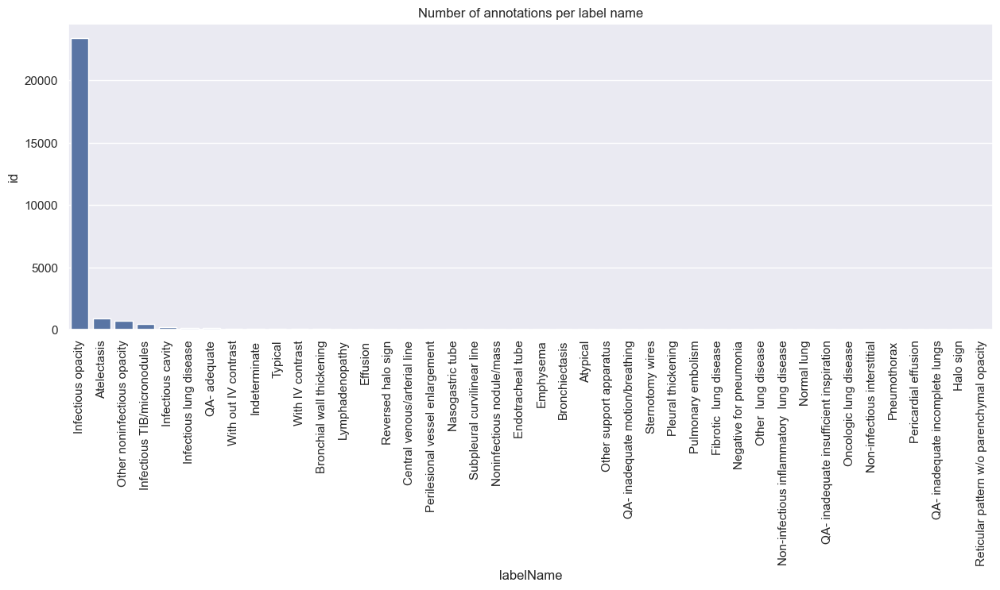

In [32]:
sns.set(rc={"figure.figsize": (15, 5)})

tmp = (
    annots_df.groupby(by=["labelName"])
    .agg({"id": "count"})
    .sort_values("id", ascending=False)
)
sns.barplot(x=tmp.index, y=tmp.id).set(title="Number of annotations per label name")
_ = plt.xticks(rotation=90)

In [33]:
annots_df.reviewsPositiveCount.unique()

array([0], dtype=int64)

In [34]:
annots_df.reviewsNegativeCount.unique()

array([0], dtype=int64)

In [36]:
annots_df.labelGroupName.unique()

array(['Purple Group 1', 'Team 2', 'Team 1'], dtype=object)

In [37]:
annots_df.number.unique()

array([ 94,  81, 105,  43,   7, 103,  80,  66, 114,  36,  73, 113,  12,
        69,  17, 115, 119,   5,  82, 106,  65,  97,  45,  38,  84,  32,
        30,  88,  77,  58,  62,  75,  54,  14,  67, 100,  25, 112,  96,
        24,  95,  53, 107,  47, 108,  16,  50,  42,  83,   6,  68,  92,
        63,  31,  55, 111,  61,  59,  37,  64,  20,  85,  46,  11,  87,
        70,   9,  10,  49,  35,  40,  72,  22,  28,  33,  76,  19,  57,
        93,  34,  86,  52,  26,  29,   1, 116,   8,  39, 102,  71,  56,
        13, 101, 109,   4,  90, 104,  15,  78,  51,  89,   2,  27,   3,
        48,  98,  79,  23,  60, 118, 110,  18, 117,  21,  41,  74,  91,
       120,  44,  99])

In [39]:
annots_df.datasetId.unique()

array(['D_q24k8z'], dtype=object)

## Load data

For the sake of testing, we focus on a single patient and a singe class.

In [50]:
# selected_class = "Atelectasis"
selected_class = "Infectious opacity"

In [51]:
patient_id = "MIDRC-RICORD-1A-419639-000082"
patient_folder = f"./data/manifest-1608266677008/MIDRC-RICORD-1A//{patient_id}/"
data_paths = glob.glob(patient_folder + "/*/2.000000-ROUTINE CHEST NON-CON-97100/*.dcm")
print(f"Total of {len(data_paths)} DICOM images.\nFirst 5 filenames:")
data_paths[:5]

Total of 255 DICOM images.
First 5 filenames:


['./data/manifest-1608266677008/MIDRC-RICORD-1A//MIDRC-RICORD-1A-419639-000082\\08-02-2002-NA-CT CHEST WITHOUT CONTRAST-04614\\2.000000-ROUTINE CHEST NON-CON-97100\\1-001.dcm',
 './data/manifest-1608266677008/MIDRC-RICORD-1A//MIDRC-RICORD-1A-419639-000082\\08-02-2002-NA-CT CHEST WITHOUT CONTRAST-04614\\2.000000-ROUTINE CHEST NON-CON-97100\\1-002.dcm',
 './data/manifest-1608266677008/MIDRC-RICORD-1A//MIDRC-RICORD-1A-419639-000082\\08-02-2002-NA-CT CHEST WITHOUT CONTRAST-04614\\2.000000-ROUTINE CHEST NON-CON-97100\\1-003.dcm',
 './data/manifest-1608266677008/MIDRC-RICORD-1A//MIDRC-RICORD-1A-419639-000082\\08-02-2002-NA-CT CHEST WITHOUT CONTRAST-04614\\2.000000-ROUTINE CHEST NON-CON-97100\\1-004.dcm',
 './data/manifest-1608266677008/MIDRC-RICORD-1A//MIDRC-RICORD-1A-419639-000082\\08-02-2002-NA-CT CHEST WITHOUT CONTRAST-04614\\2.000000-ROUTINE CHEST NON-CON-97100\\1-005.dcm']

In [52]:
patient_dicom = load_scan(data_paths)
patient_pixels = get_pixels_hu(patient_dicom)
patient_pixels.shape

(255, 512, 512)

In [53]:
masks = []
height = annots_df.height.max()
width = annots_df.height.max()
for i in range(len(patient_dicom)):
    mask = np.zeros((height, width), dtype=np.uint8)
    for i, a in annots_df[
        (annots_df["SOPInstanceUID"] == patient_dicom[i].SOPInstanceUID)
    ].iterrows():
        if a.labelName == selected_class:
            mask = np.maximum(mask, load_mask_instance(a))
    masks.append(mask)
masks = np.array(masks)

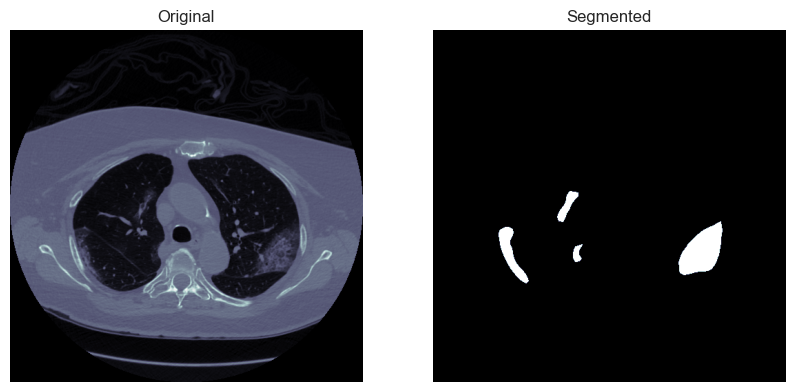

In [54]:
id = 180
f, ax = plt.subplots(1, 2, figsize=(10, 6))
ax[0].imshow(patient_pixels[id], cmap=plt.cm.bone)
ax[0].axis(False)
ax[0].set_title("Original")
ax[1].imshow(masks[id], cmap=plt.cm.bone)
ax[1].axis(False)
ax[1].set_title("Segmented")
plt.show()

Original Image Slices before processing


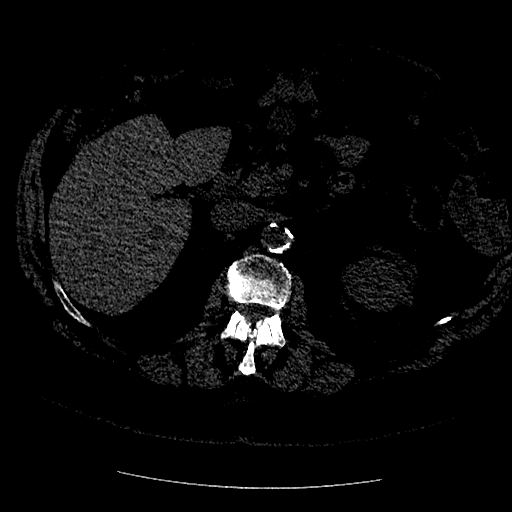

In [55]:
import imageio
from IPython import display

print("Original Image Slices before processing")
imageio.mimsave(f"./{patient_id}.gif", patient_pixels, duration=0.05)
display.Image(f"./{patient_id}.gif", format="png")

Lung Segmentation Mask


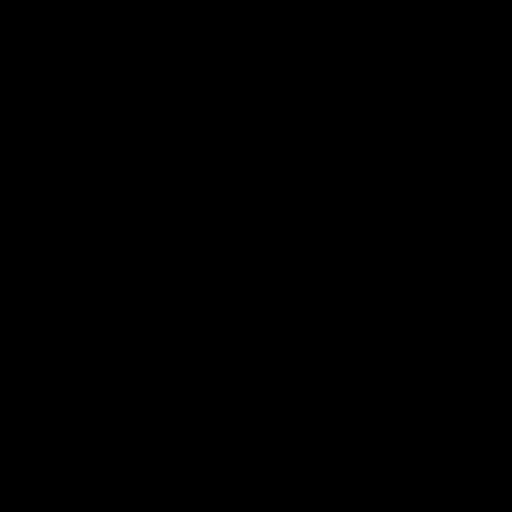

In [56]:
print("Lung Segmentation Mask")
imageio.mimsave(f"./{patient_id}.gif", masks, duration=0.05)
display.Image(f"./{patient_id}.gif", format="png")

## Prepare data for modelling

In [57]:
img_patch = patchify(normalize_3d(patient_pixels), (64, 64, 64), step=64)
mask_patch = patchify(masks, (64, 64, 64), step=64)

In [58]:
img_patch.shape

(3, 8, 8, 64, 64, 64)

In [59]:
mask_patch.shape

(3, 8, 8, 64, 64, 64)

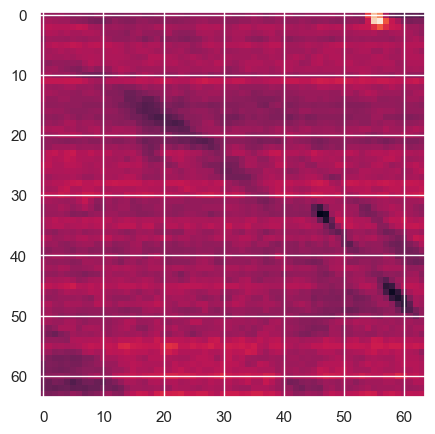

In [60]:
plt.imshow(img_patch[1, 4, 4, :, :, 32])

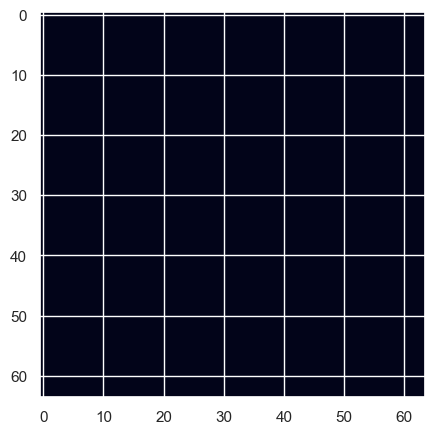

In [61]:
plt.imshow(mask_patch[1, 4, 3, :, :, 50])

In [62]:
input_img = np.reshape(
    img_patch, (-1, img_patch.shape[3], img_patch.shape[4], img_patch.shape[5])
)
input_mask = np.reshape(
    mask_patch, (-1, mask_patch.shape[3], mask_patch.shape[4], mask_patch.shape[5])
)
input_img.shape

(192, 64, 64, 64)

In [63]:
n_classes = 2

In [64]:
train_img = np.stack((input_img,) * 3, axis=4)
train_mask = np.expand_dims(input_mask, axis=4)

In [65]:
train_mask.shape

(192, 64, 64, 64, 1)

In [66]:
train_mask_cat = to_categorical(train_mask / 255)
train_mask_cat.shape

(192, 64, 64, 64, 2)

In [67]:
X_train, X_test, y_train, y_test = train_test_split(
    train_img, train_mask_cat, test_size=0.10, random_state=5
)

In [68]:
# Loss Function and coefficients to be used during training:
def dice_coefficient(y_true, y_pred):
    smoothing_factor = 1
    flat_y_true = K.flatten(y_true)
    flat_y_pred = K.flatten(y_pred)
    return (2.0 * K.sum(flat_y_true * flat_y_pred) + smoothing_factor) / (
        K.sum(flat_y_true) + K.sum(flat_y_pred) + smoothing_factor
    )


def dice_coefficient_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

In [69]:
# Define parameters for our model.

encoder_weights = "imagenet"
backbone = "vgg16"  # Try vgg16, efficientnetb7, inceptionv3, resnet50
activation = "sigmoid"
patch_size = 64
n_classes = 2
channels = 3
patience = 50
steps_per_epoch = 5
validation_steps = 5

learning_rate = 0.0001
optim = tf.keras.optimizers.Adam(learning_rate)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (car: 1.; pedestrian: 2.; background: 0.5;)
# dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.5, 0.5]))
# focal_loss = sm.losses.CategoricalFocalLoss()
# total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
total_loss = (
    sm.losses.binary_focal_dice_loss
)  # or sm.losses.categorical_focal_dice_loss

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

In [70]:
preprocess_input = sm.get_preprocessing(backbone)
# Preprocess input data - otherwise you end up with garbage resutls
# and potentially model that does not converge.
X_train_prep = preprocess_input(X_train)
X_test_prep = preprocess_input(X_test)

In [71]:
# Define the model. Here we use Unet but we can also use other model architectures from the library.
model = sm.Unet(
    backbone,
    classes=n_classes,
    input_shape=(patch_size, patch_size, patch_size, channels),
    encoder_weights=encoder_weights,
    activation=activation,
)

model.compile(optimizer=optim, loss=total_loss, metrics=metrics)
print(model.summary())

cache_model_path = "{}_temp.h5".format(backbone)
best_model_path = "{}".format(backbone) + "-{val_iou_score:.4f}-{epoch:02d}.h5"
callbacks = [
    ModelCheckpoint(cache_model_path, monitor="val_loss", verbose=0),
    ModelCheckpoint(best_model_path, monitor="val_loss", verbose=0),
    # Reducelearning_rateOnPlateau(
    #     monitor="val_iou_score",
    #     factor=0.95,
    #     patience=3,
    #     min_learning_rate=1e-9,
    #     min_delta=1e-8,
    #     verbose=1,
    #     mode="max",
    # ),
    CSVLogger(
        "history_{}_learning_rate_{}.csv".format(backbone, learning_rate), append=True
    ),
    EarlyStopping(monitor="val_iou_score", patience=patience, verbose=0, mode="max"),
]

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 64,  0           []                               
                                 3)]                                                              
                                                                                                  
 block1_conv1 (Conv3D)          (None, 64, 64, 64,   5248        ['input_1[0][0]']                
                                64)                                                               
                                                                                                  
 block1_conv2 (Conv3D)          (None, 64, 64, 64,   110656      ['block1_conv1[0][0]']           
                                64)                                                           

In [72]:
# Fit the model
history = model.fit(
    X_train_prep,
    y_train,
    batch_size=4,
    epochs=3,
    verbose=1,
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    validation_data=(X_test_prep, y_test),
    callbacks=callbacks,
)

Epoch 1/3
5/5 [==============================] - 442s 85s/step - loss: 0.7826 - iou_score: 0.3432 - f1-score: 0.4100 - val_loss: 1.2428 - val_iou_score: 0.1708 - val_f1-score: 0.2571
Epoch 2/3
5/5 [==============================] - 421s 84s/step - loss: 0.7335 - iou_score: 0.3915 - f1-score: 0.4528 - val_loss: 0.9891 - val_iou_score: 0.2187 - val_f1-score: 0.3096
Epoch 3/3
5/5 [==============================] - 403s 79s/step - loss: 0.7183 - iou_score: 0.4232 - f1-score: 0.4583 - val_loss: 0.8155 - val_iou_score: 0.2526 - val_f1-score: 0.3406


In [ ]:
# model.save(
#     "./3D_model_vgg16_100epochs.h5"
# )

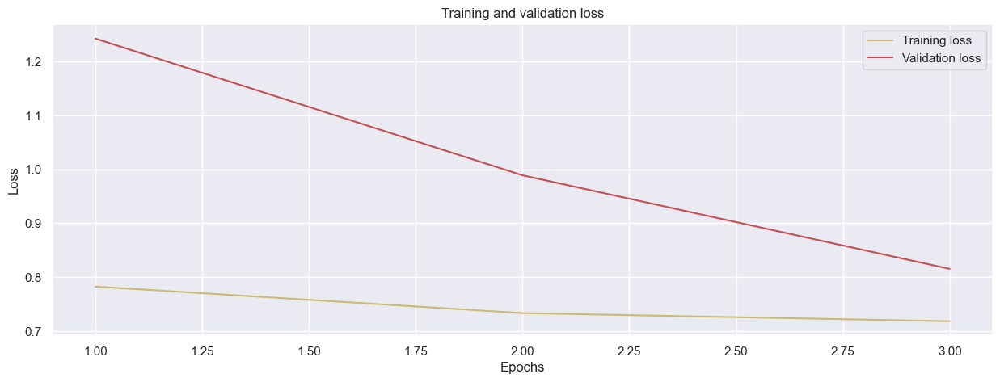

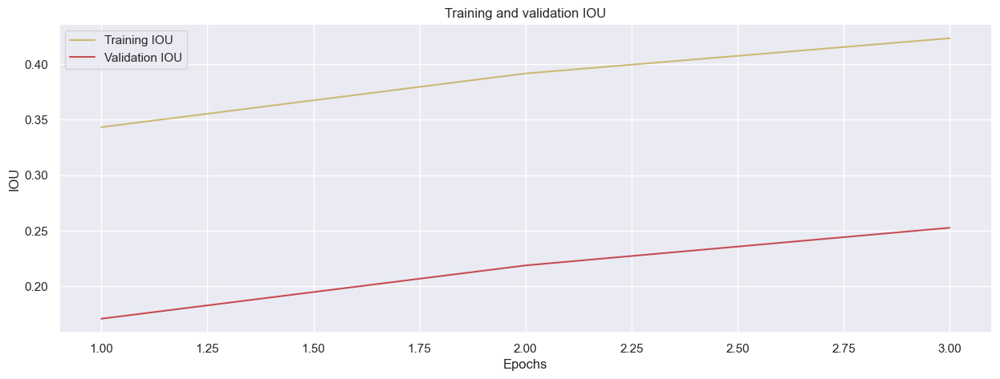

In [73]:
###
# plot the training and validation IoU and loss at each epoch
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, "y", label="Training loss")
plt.plot(epochs, val_loss, "r", label="Validation loss")
plt.title("Training and validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

acc = history.history["iou_score"]
val_acc = history.history["val_iou_score"]

plt.plot(epochs, acc, "y", label="Training IOU")
plt.plot(epochs, val_acc, "r", label="Validation IOU")
plt.title("Training and validation IOU")
plt.xlabel("Epochs")
plt.ylabel("IOU")
plt.legend()
plt.show()

In [ ]:
# Load the pretrained model for testing and predictions.
from keras.models import load_model

my_model = load_model(
    "/content/drive/MyDrive/Colab Notebooks/data/sandstone_3d/3D_model_vgg16_100epochs.h5",
    compile=False,
)
# If you load a different model do not forget to preprocess accordingly.

In [74]:
# Predict on the test data
y_pred = model.predict(X_test)
y_pred_argmax = np.argmax(y_pred, axis=4)
y_test_argmax = np.argmax(y_test, axis=4)

In [75]:
print(y_pred_argmax.shape)
print(y_test_argmax.shape)
print(np.unique(y_pred_argmax))

(20, 64, 64, 64)
(20, 64, 64, 64)
[0 1]


In [ ]:
# Using built in keras function for IoU
# Only works on TF > 2.0
# from keras.metrics import MeanIoU
# from keras.metrics import MeanIoU
# n_classes = 4
# IOU_keras = MeanIoU(num_classes=n_classes)
# IOU_keras.update_state(y_test_argmax, y_pred_argmax)
# print("Mean IoU =", IOU_keras.result().numpy())

In [76]:
# Test some random images
import random

test_img_number = random.randint(0, len(X_test))
test_img = X_test[test_img_number]
ground_truth = y_test[test_img_number]

test_img_input = np.expand_dims(test_img, 0)
test_img_input1 = preprocess_input(test_img_input)

test_pred1 = model.predict(test_img_input1)
test_prediction1 = np.argmax(test_pred1, axis=4)[0, :, :, :]
print(test_prediction1.shape)

(64, 64, 64)


In [77]:
ground_truth_argmax = np.argmax(ground_truth, axis=3)
print(test_img.shape)

(64, 64, 64, 3)


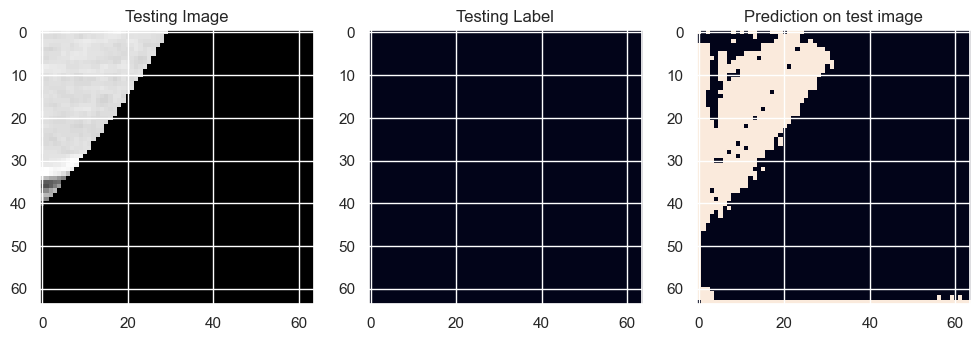

In [79]:
# Plot individual slices from test predictions for verification
slice = 32
plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title("Testing Image")
plt.imshow(test_img[slice, :, :, 0], cmap="gray")
plt.subplot(232)
plt.title("Testing Label")
plt.imshow(ground_truth_argmax[slice, :, :])
plt.subplot(233)
plt.title("Prediction on test image")
plt.imshow(test_prediction1[slice, :, :])
plt.show()

In [ ]:
# encoder_weights = "imagenet"
# shape_size = (96, 96, 96, 3)
# backbone = "resnet18"
# num_classes = 1
# batch_size_train = 1
# batch_size_valid = 1
# learning_rate = 0.0001
# patience = 10
# epochs = 3
# steps_per_epoch = 5
# validation_steps = 5

# model = sm.Unet(
#     backbone,
#     input_shape=shape_size,
#     encoder_weights=encoder_weights,
#     classes=num_classes,
#     #    activation="softmax",
# )
# print(model.summary())
# print(get_model_memory_usage(batch_size_train, model))
# preprocess_input = sm.get_preprocessing(backbone)
# optim = Adam(learning_rate=learning_rate)

# loss_to_use = sm.losses.bce_jaccard_loss
# model.compile(
#     optimizer=optim,
#     loss=loss_to_use,
#     metrics=[sm.metrics.iou_score, sm.metrics.f1_score],
# )

# cache_model_path = "{}_temp.h5".format(backbone)
# best_model_path = "{}".format(backbone) + "-{val_iou_score:.4f}-{epoch:02d}.h5"
# callbacks = [
#     ModelCheckpoint(cache_model_path, monitor="val_loss", verbose=0),
#     ModelCheckpoint(best_model_path, monitor="val_loss", verbose=0),
#     Reducelearning_ratearning_rateOnPlateau(
#         monitor="val_iou_score",
#         factor=0.95,
#         patience=3,
#         min_learning_rate=1e-9,
#         min_delta=1e-8,
#         verbose=1,
#         mode="max",
#     ),
#     CSVLogger("history_{}_learning_rate_{}.csv".format(backbone, learning_rate), append=True),
#     EarlyStopping(monitor="val_iou_score", patience=patience, verbose=0, mode="max"),
# ]

In [ ]:
# gen_train = batch_generator(
#     batch_size_train, preprocess_input, patient_pixels=patient_pixels, masks=masks_new
# )
# gen_valid = batch_generator(
#     batch_size_valid, preprocess_input, patient_pixels=patient_pixels, masks=masks_new
# )
# history = model.fit(
#     gen_train,
#     epochs=epochs,
#     steps_per_epoch=steps_per_epoch,
#     validation_data=gen_valid,
#     validation_steps=validation_steps,
#     verbose=1,
#     max_queue_size=10,
#     initial_epoch=0,
#     callbacks=callbacks,
# )

# max_iou = max(history.history["val_iou_score"])
# print("Training finished. Max IoU: {}".format(max_iou))